<a href="https://colab.research.google.com/github/mario-rot/ComputerVisionCourse-MAI/blob/main/Session%2010/p10_Mario_Lauren.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Laboratory #11 (1) : Image Segmentation using Handcrafted Features

At the end of this laboratory, you would get familiarized with

*   Segmentation using SLIC, Felzenszwalb and Quickshift

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   You will have to mount your drive if you need to access images.

**Note that in real images, it is difficult to obtain a good segmentation, and the definition of "good" often depends on the application. Hence, these methods can be used for obtaining
an oversegmentation, also known as superpixels. These superpixels then serve as
a basis for more sophisticated algorithms such as conditional random fields
(CRF).
Source: [scikit-image docs](https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_segmentations.html#sphx-glr-auto-examples-segmentation-plot-segmentations-py)**

---

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%%shell
git clone https://github.com/mario-rot/ComputerVisionCourse-MAI.git
cd 'ComputerVisionCourse-MAI'
mv 'Session 10/images' /content/
mv 'customplots.py' /content/
mv 'utils.py' /content/

Cloning into 'ComputerVisionCourse-MAI'...
remote: Enumerating objects: 12350, done.
remote: Counting objects: 100% (771/771), done.
remote: Compressing objects: 100% (517/517), done.
remote: Total 12350 (delta 230), reused 766 (delta 225), pack-reused 11579
Receiving objects: 100% (12350/12350), 141.02 MiB | 26.66 MiB/s, done.
Resolving deltas: 100% (233/233), done.
Checking out files: 100% (11923/11923), done.


In [3]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)
import sys
sys.path.append('../')
from skimage import color, data, io, segmentation
import matplotlib.pyplot as plt
import numpy as np
from customplots import custom_grids, test_params

# SLIC (Simple Linear Iterative Clustering)

*   What is the underlying algorithm for SLIC?
*   Explain SLIC algorithm in detail

**Solution**

*The underlying algorithm for SLIC is k-means.*
<br/><br/>

*In more detail, the algorithm can be described as follows:*

*- initialize cluster centers by sampling pixels at regular grid steps*

*- adjust the position of the cluster centers to the lowest gradient position*

*- until error measure decreases below threshold:*
  - *for each cluster center, use the distance measure to assign the best matching pixels from the neighborhood to that center*

  - *compute the new cluster centers and the error*

...

*   Load coffee image from the data module and perform SLIC with the default parameters.
*   Plot the original image and the SLIC segments using matplotlib subplot.
*   Hint: 
    *   The labels could be visualized using mark_boundaries function available in segmentation module.
    *   All segmentation algorithms are available in the segmentation module.

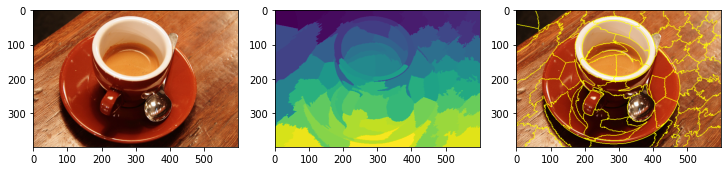

In [5]:
# solution
coffee = data.coffee()
coffee_slic = segmentation.slic(coffee, start_label=1)
coffee_boundaries = segmentation.mark_boundaries(coffee, coffee_slic)
custom_grids([coffee, coffee_slic, coffee_boundaries],1,3).show()

## Number of Segments

*   Vary the parameter n_segments in powers of 2 starting from 1 to 10.
*   Plot the labels using matplotlib subplot

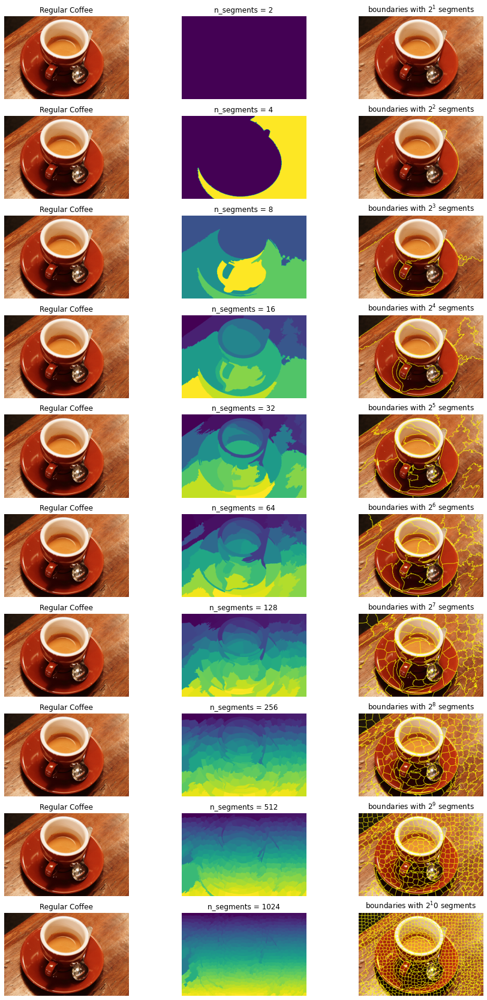

In [6]:
# solution
slics = []
titles = []
for i in range(1,11):
  temp_slic =  segmentation.slic(coffee, start_label=1,n_segments=2**i)
  slics.append(coffee)
  slics.append(temp_slic)
  slics.append(segmentation.mark_boundaries(coffee, temp_slic))
  titles = titles + ['Regular Coffee', 'n_segments = {}'.format(2**i), 'boundaries with $2^{}$ segments'.format(i)]



custom_grids(slics,10,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()

*   What do you infer with the results of different segments?

**Solution**

*Having too few segments results in poor separation of different areas, grouping together parts of the image that should be separated. On the other hand, having too many segments creates too much separation, separating parts of the image that should be identified as being together.*

...

## Compactness

*   What do you infer from the parameter compactness?

**Solution**

*The compactness value determines whether more consideration is given to space proximity or to color proximity when creating segments. With a higher value, space proximity is valued more, so more grid-like, square-shaped segments will be formed.*

...

*   Fixing the n_segments as 16, vary the compactness from 10 to 100 with a step size of 10
*   Plot the labels using matplotlib subplot

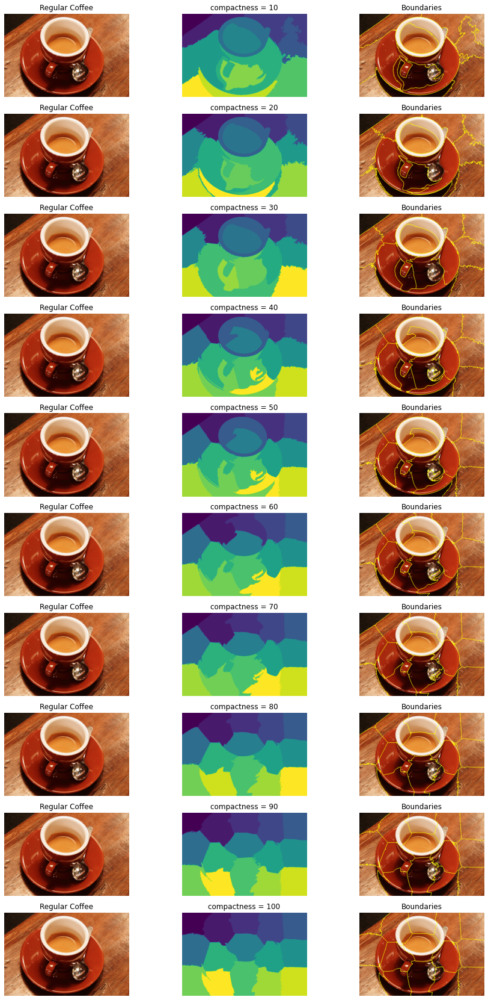

In [7]:
# solution
# solution
slics = []
titles = []
for i in range(1,11):
  temp_slic =  segmentation.slic(coffee, start_label=1,n_segments=16, compactness= i*10)
  slics.append(coffee)
  slics.append(temp_slic)
  slics.append(segmentation.mark_boundaries(coffee, temp_slic))
  titles = titles + ['Regular Coffee', 'compactness = {}'.format(i*10), 'Boundaries'.format(i*10)]



custom_grids(slics,10,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()


*   Fixing the n_segments as 16, vary the compactness from 10^-6 to 10^3
*   Plot the labels using matplotlib subplot

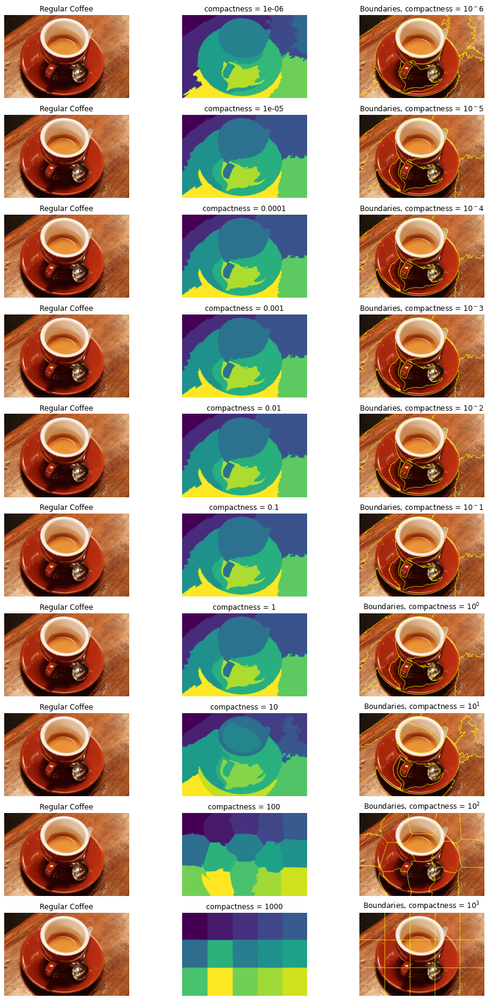

In [8]:
# solution
slics = []
titles = []
for i in range(-6,4):
  temp_slic =  segmentation.slic(coffee, start_label=1,n_segments=16, compactness= 10**i)
  slics.append(coffee)
  slics.append(temp_slic)
  slics.append(segmentation.mark_boundaries(coffee, temp_slic))
  titles = titles + ['Regular Coffee', 'compactness = {}'.format(10**i), 'Boundaries, compactness = $10^{}$'.format(i)]



custom_grids(slics,10,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()

*   What happens with the change in compactness value?
*   What is the relationship between compactness and n_segment?

**Solution**

- *As the compactness value increases, the segments become more square.*

- *The compactness and n_segment parameters can be combined and altered to achieve the best shape and size of segments.*

...

*   Plot the original image, the SLIC labels and the SLIC contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

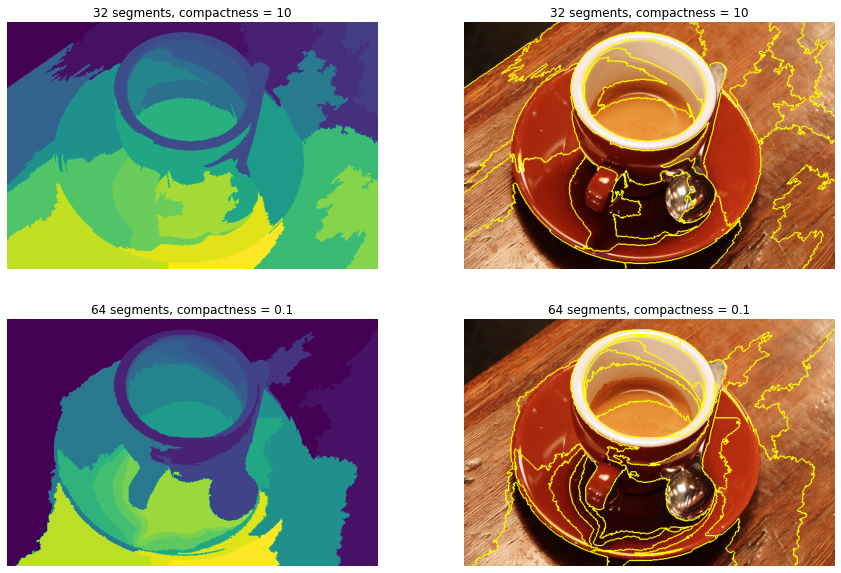

In [9]:
# solution
s1 = [segmentation.slic(coffee, start_label=1,n_segments=32, compactness= 10), segmentation.mark_boundaries(coffee, segmentation.slic(coffee, start_label=1,n_segments=32, compactness= 10))]
s1 += [segmentation.slic(coffee, start_label=1,n_segments=64, compactness= 10**(-1)), segmentation.mark_boundaries(coffee, segmentation.slic(coffee, start_label=1,n_segments=64, compactness= 10**(-1)))]
custom_grids(s1,2,2,['32 segments, compactness = 10', '32 segments, compactness = 10','64 segments, compactness = 0.1', '64 segments, compactness = 0.1'], figsize=(15,10), use_grid_spec=False, axis = 'off').show()

# Felzenszwalb’s Efficient graph based segmentation

*   What is the underlying algorithm for Felzenszwalb's segmentation?
*   Explain the algorithm in detail

**Solution**

*The underlying algorithm for Felzenzwalb's segmentation is Agglomerative Clustering.*

*The algorithm is described as follows, considering the image input as a nondirected graph:*
- *Sort the "edges" between pixels by increasing edge weight, where the weight is the dissimilarity between the pixels*
- *Create an initial segmentation where each vertex of the graph (each pixel) is in its own segment*
- *For all edges:*
  - *If the two pixels of an edge are not already in the same segment, and the weight between them is smaller than the internal difference between, then they should be combined into the same segment*
- *Return the final segments*

...

*   Load coffee image from the data module and perform Felzenszwalb with the default parameters.
*   Plot the original image, Felzenszwalb segments and slic segments using matplotlib subplot.

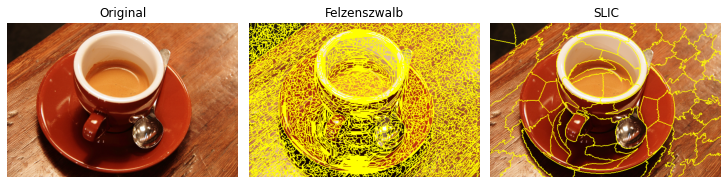

In [10]:
# solution
coffee_felz = segmentation.felzenszwalb(coffee)
coffee_fboundaries = segmentation.mark_boundaries(coffee, coffee_felz)
custom_grids([coffee, coffee_fboundaries, coffee_boundaries],1,3, titles=['Original', 'Felzenszwalb', 'SLIC'], axis = 'off').show()

## Scale parameter

*   What does the parameter scale represent?

**Solution**

*The scale parameter indirectly changes the size and number of segments. In general, a higher value for scale creates larger segments. However, the number of segments isn't explicitly set by this value, so for different images, the same scale value may produce different numbers of segments. This is because the number of segments and their size are ultimately dependent on local contrast within an image.*

...

*   Vary scale values from 0 to 100 with a step size of 10

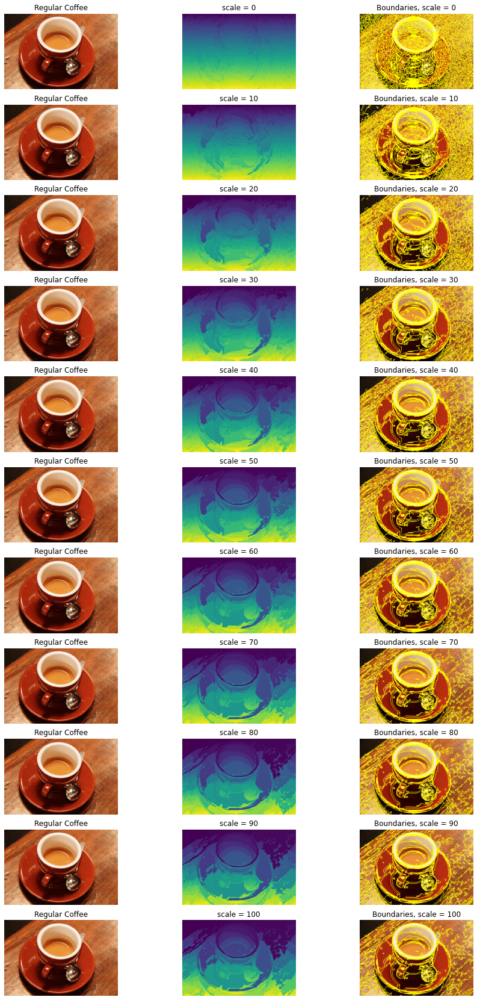

In [11]:
# solution
fzs = []
titles = []
for i in range(0, 101, 10):
  temp_fzs =  segmentation.felzenszwalb(coffee, scale=i)
  fzs.append(coffee)
  fzs.append(temp_fzs)
  fzs.append(segmentation.mark_boundaries(coffee, temp_fzs))
  titles = titles + ['Regular Coffee', 'scale = {}'.format(i), 'Boundaries, scale = {}'.format(i)]

custom_grids(fzs,11,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()

*   What do you infer with the changes in the scale parameter?

**Solution**

*In our example, as scale increases, the size of the segments increases as expected.*

...

*   Plot the original image, the Felzenszwalb labels and the Felzenszwalb contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

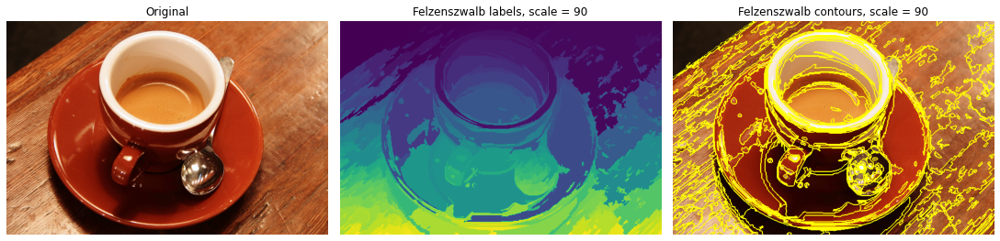

In [12]:
# solution
best_felz = segmentation.felzenszwalb(coffee, scale=90)
best_felz_boundaries = segmentation.mark_boundaries(coffee, best_felz)

custom_grids([coffee, best_felz, best_felz_boundaries],1,3, ['Original', 'Felzenszwalb labels, scale = 90', 'Felzenszwalb contours, scale = 90'], figsize=(15,30), use_grid_spec=True, axis = 'off').show()

In [13]:
print('Total number of segments with the best scale value (scale=90): ', len(set(np.reshape(best_felz, (400*600)))))

Total number of segments with the best scale value (scale=90):  704


# Quickshift Image Segmentation

*   What is the underlying algorithm for Quickshift segmentation?
*   Explain Quickshift algorithm in detail

**Solution**

*The underlying algorithm for Quickshift segmentation is Mean Shift.*

*The Quickshift algorithm can be described as follows (retrieved from the lecture slide):*
- *Convert the image into tokens (via color, gradients, texture measures, etc.).*

- *Choose initial search window locations uniformly in the data.*

- *Compute the mean shift window location for each initial position.*

- *Merge windows that end up on the same “peak” or mode.*

- *The data these merged windows traversed are clustered together*

...

*   Load coffee image from the data module and perform Quickshift with the default parameters.
*   Plot the original image, quickshift segments, Felzenszwalb segments and slic segments using matplotlib subplot.

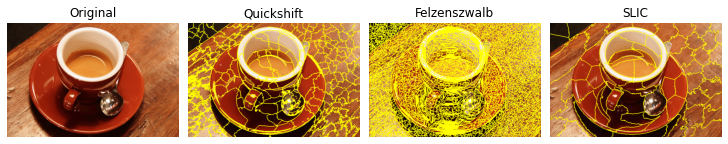

In [14]:
# solution

coffee_qs = segmentation.quickshift(coffee)
coffee_qs_boundaries = segmentation.mark_boundaries(coffee, coffee_qs)

custom_grids([coffee, coffee_qs_boundaries, coffee_fboundaries, coffee_boundaries], 1, 4, ['Original', 'Quickshift', 'Felzenszwalb', 'SLIC'], axis='off').show()

## Sigma

*   What does the parameter sigma represent?

**Solution**

*The sigma parameter represents the width for Gaussian smoothing during preprocessing.*

...

*   Vary sigma values from 0 to 9 with a step size of 1

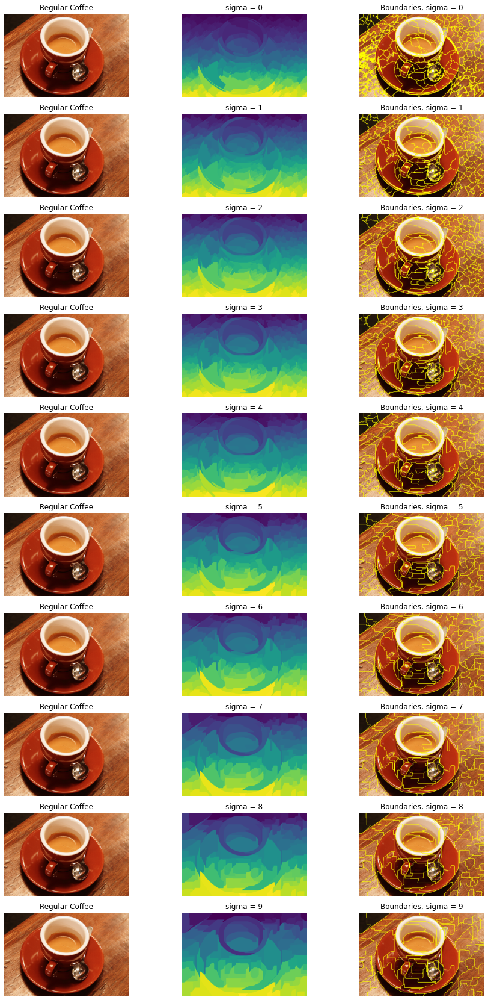

In [ ]:
# solution
quickshifts = []
titles = []
for i in range(0, 10):
  temp_qs =  segmentation.quickshift(coffee, sigma=i)
  quickshifts.append(coffee)
  quickshifts.append(temp_qs)
  quickshifts.append(segmentation.mark_boundaries(coffee, temp_qs))
  titles = titles + ['Regular Coffee', 'sigma = {}'.format(i), 'Boundaries, sigma = {}'.format(i)]

custom_grids(quickshifts,10,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()


*   What do you infer with the changes in sigma?

**Solution**

*In our example, as sigma increases, the number of segments decreases. This is because with more smoothing, there is less variability in color contrast. Therefore, larger areas have more similar colors and can then be captured in one larger segment as opposed to several smaller segments without smoothing.*

...

## Max dist

*   Vary the parameter max_dist in powers of 2 starting from 1 to 10.
*   Plot the segments using matplotlib subplot

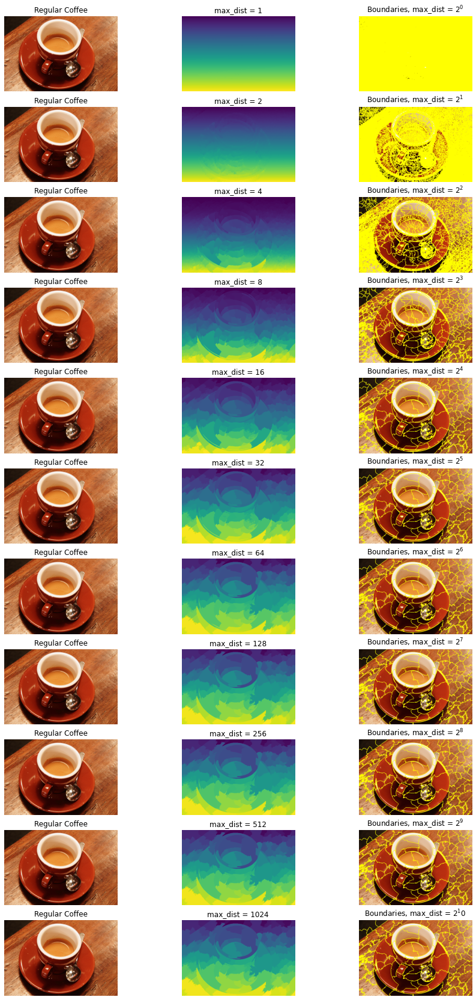

In [ ]:
# solution
quickshifts = []
titles = []
for i in range(0, 11):
  temp_qs =  segmentation.quickshift(coffee, max_dist=2**i)
  quickshifts.append(coffee)
  quickshifts.append(temp_qs)
  quickshifts.append(segmentation.mark_boundaries(coffee, temp_qs))
  titles = titles + ['Regular Coffee', 'max_dist = {}'.format(2**i), 'Boundaries, max_dist = $2^{}$'.format(i)]

custom_grids(quickshifts,11,3, titles, figsize=(15,30), use_grid_spec=False, axis = 'off').show()


*   What do you infer with the results of different segments?

**Solution**

*In our example, as the max_dist parameter increases, the number of segments decreases.*

...

*   Plot the original image, Quickshift segments and the Quickshift contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

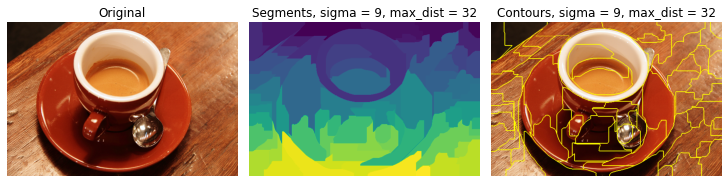

In [16]:
# solution
best_qs = segmentation.quickshift(coffee, sigma=9, max_dist=32)
best_qs_boundaries = segmentation.mark_boundaries(coffee, best_qs)

custom_grids([coffee, best_qs, best_qs_boundaries], 1,3, ['Original', 'Segments, sigma = 9, max_dist = 32', 'Contours, sigma = 9, max_dist = 32'], axis='off').show()

In [17]:
print('Total number of segments with the best sigma and max_dist values (sigma=9, max_dist=32): ', len(set(np.reshape(best_qs, (400*600)))))

Total number of segments with the best sigma and max_dist values (sigma=9, max_dist=32):  69


# Segmentation of Fruits

*   Load the folder 'images'
*   For each image, find the best segmentation parameters using Felzenszwalb, quickshift and slic
*   Plot the results using matplotlib subplot, where in each row, show the original image, slic segments and quickshift segments.
*   Show the number of segments in the title of the plot for each image.

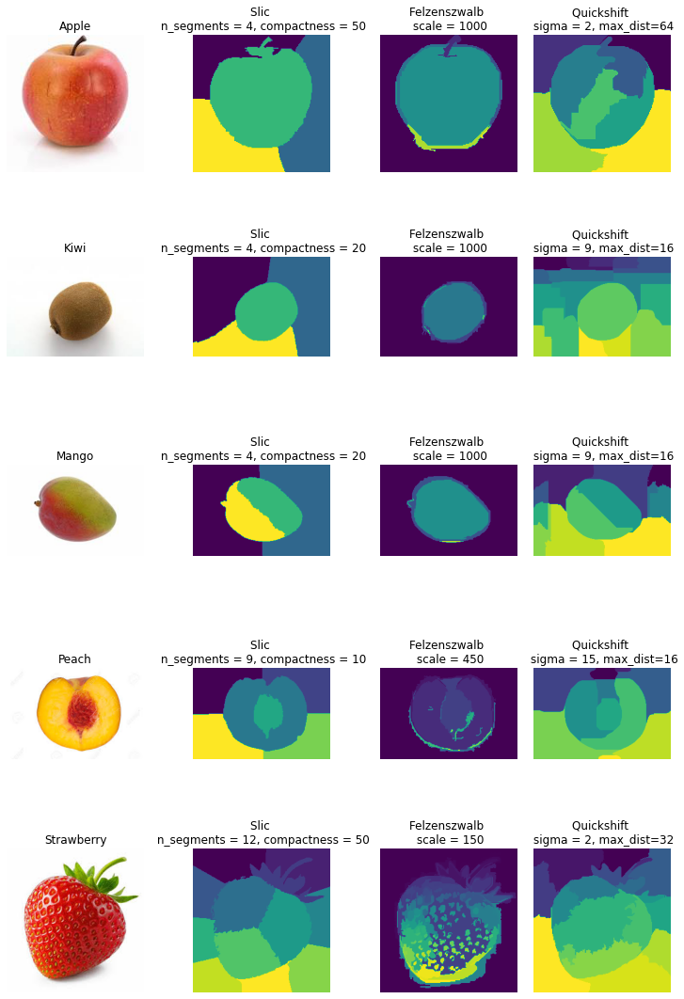

In [ ]:
# solution
images = io.imread_collection('./images/*')

apple_s = segmentation.slic(images[0],start_label = 1, n_segments = 4, compactness = 50)
kiwi_s = segmentation.slic(images[1],start_label = 1,n_segments = 4, compactness = 20)
mango_s = segmentation.slic(images[2],start_label = 1,n_segments = 4, compactness = 20)
peach_s = segmentation.slic(images[3],start_label = 1,n_segments = 9, compactness = 10)
strawberry_s = segmentation.slic(images[4],start_label = 1,n_segments = 12, compactness = 50)

apple_f = segmentation.felzenszwalb(images[0],scale = 1000)
kiwi_f = segmentation.felzenszwalb(images[1],scale = 1000)
mango_f = segmentation.felzenszwalb(images[2],scale = 1000)
peach_f = segmentation.felzenszwalb(images[3],scale = 450)
strawberry_f = segmentation.felzenszwalb(images[4],scale = 150)

apple_q = segmentation.quickshift(images[0],sigma = 2, max_dist=64)
kiwi_q = segmentation.quickshift(images[1],sigma = 9, max_dist=16)
mango_q = segmentation.quickshift(images[2],sigma = 9, max_dist=16)
peach_q = segmentation.quickshift(images[3],sigma = 15, max_dist=16)
strawberry_q = segmentation.quickshift(images[4],sigma = 2, max_dist=32)

ims = [images[0], apple_s, apple_f, apple_q,
       images[1], kiwi_s, kiwi_f, kiwi_q,
       images[2], mango_s, mango_f, mango_q,
       images[3], peach_s, peach_f, peach_q,
       images[4], strawberry_s, strawberry_f, strawberry_q]
titles = ['Apple', 'Slic \n n_segments = 4, compactness = 50', 'Felzenszwalb \n scale = 1000','Quickshift \n sigma = 2, max_dist=64',
          'Kiwi', 'Slic \n n_segments = 4, compactness = 20', 'Felzenszwalb \n scale = 1000',  'Quickshift \n sigma = 9, max_dist=16',
          'Mango', 'Slic \n n_segments = 4, compactness = 20', 'Felzenszwalb \n scale = 1000', 'Quickshift \n sigma = 9, max_dist=16',
          'Peach', 'Slic \n n_segments = 9, compactness = 10', 'Felzenszwalb \n scale = 450', 'Quickshift \n sigma = 15, max_dist=16',
          'Strawberry', 'Slic \n n_segments = 12, compactness = 50','Felzenszwalb \n scale = 150','Quickshift \n sigma = 2, max_dist=32']

custom_grids(ims,5,4, titles, axis = 'off', figsize=(10,15)).show()

*   For each of the image, do you find the segmentation proper? If not, what could be the possible reason?

**Solution**

*Whether or not each segmentation is proper depends on the goal of the segmentation. For example, if the goal is just to get the shape of the image, then, in the case of the strawberry, SLIC and Quickshift perform better than Felzenszwalb. However, if we also want information about the seeds on the strawberry, Felzenszwalb is the only segmentation that provides us with this information. Otherwise, all the algorithms provide adequate segmenations. Quickshift tends to produce more segments in the subject of each image, but still is finding the shape properly.*

...

# Evaluating Segmentation 

*   How do you evaluate image segmentation?
*   What are the metrics commonly used?

**Solution**

*Image segmentation can be evaluated using several metrics, including precision, recall, f1-score, overlap, dice coefficient, Jaccard coefficient, and IOU.*

...


---

# **End of P11 (1): Image Segmentation using Handcrafted Features**